In [41]:
%load_ext autoreload
%autoreload 2
import os, sys, re
import numpy as np
import pandas as pd
import scanpy as sc
import torch
import time
import PINN
from functools import partial
from PINN import reader, models, pl, tl
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from TorchDiffEqPack import odesolve
from torchdiffeq import odeint_adjoint as odeint
import mellon
import matplotlib as mpl
import seaborn as sns
from matplotlib.patches import Patch
from scipy.stats import pearsonr, spearmanr
from matplotlib.backends.backend_pdf import PdfPages

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
main_dir="/ssd/users/Wergillius/Project/PINN_dynamics"
os.chdir(main_dir)
TM1=[0,1,2,3,4,6,8]
TM2=[0,1,2,3,5]

data_name = 'tom_pos'
cellstate_key = 'DM_scaled'
timepoint_key = 'timepoint_tx_days'
n_dimension = 30 
ct_key = 'anno_man'

In [9]:
adata = sc.read_h5ad(f"data/{data_name}.h5ad")

In [4]:
gas = sc.read_h5ad(f"data/gastrulation.h5ad")

In [5]:
gas.obs['timepoint_tx_days'].unique()

array([6.5 , 7.5 , 6.75, 7.75, 7.  , 8.  , 8.5 , 7.25, 8.25])

In [6]:
gas

AnnData object with n_obs × n_vars = 98192 × 16695
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'TP_density', 'custom_exclude', 'exclude_mask', 'exclude', 'colored_celltypes', 'palantir_pseudotime', 'palantir_entropy', 'stage_numerical', 'log_density_at_E7.1', 'log_density_at_E6.5', 'log_density_at_E7.0', 'log_density_at_E7.5', 'log_density_at_E8.0', 'log_density_at_E8.5', 'timepoint_tx_days'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'DM_EigenValues', 'celltype_colors', 'colored_celltypes_colors', 'density_predictor', 'exclude_colors', 'hvg', 'neighbors', 'palantir_waypoints', 'pca', 'pop', 'stag

In [13]:
adata.obs[timepoint_key].unique()

array([269, 161,   7,  27,  12,  76,  49, 112,   3])

In [11]:
weinreb = sc.read_h5ad(f"data/klein_subset.h5ad")

In [5]:
device='cuda:2'

# eval density func

In [6]:
sc.tl.leiden(adata, resolution=4, key_added='rs4.0')
adata.obs['rs4.0'].nunique()

/tmp/ipykernel_2887703/3330721392.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=4, key_added='rs4.0')


190

In [8]:
u_theta  = PINN.models.pde_params.load_from_checkpoint("logs/tom_pos-DM_scaled_n9/pde_params_tsense/lightning_logs/version_0/checkpoints/epoch=224-total_loss=0.81510490.ckpt", map_location='cpu')
u_theta = u_theta.to(device)

In [19]:
X = adata.obsm[cellstate_key]
cs = torch.from_numpy(X[:,:10]).to(device).float()

In [ ]:
log_u_t = []
t0 = adata.uns['pop']['t'][0]
for t in adata.uns['pop']['t']:
    t_in = torch.full((X.shape[0],), t/t0).to(device).float()
    with torch.no_grad():
        u = u_theta.u(cs, t_in)
        log_u_t.append(u.cpu().numpy())
        del u

log_u_t = np.stack(log_u_t)

log_u_t.shape

(9, 49390)

In [24]:
np.save(f"data/tom_pos_surrogate_logu.npy", log_u_t)

In [27]:
# mellon
timepoints = adata.uns['pop']['t']
t_pred = mellon.Predictor.from_json(f"data/tom_pos_mellon_timecontinuous_predictor.json")
u_time_model = np.stack([t_pred(X, np.full((X.shape[0],), np.log(t))) for t in timepoints])

In [43]:
np.exp(log_u_t)

array([[7.8514213e-06, 8.3113118e-06, 4.4334352e-06, ..., 8.9242174e-05,
        3.7256919e-07, 6.0370057e-05],
       [8.9583176e-05, 2.3515557e-05, 1.7893088e-05, ..., 1.6460408e-04,
        1.0299162e-05, 1.0282424e-04],
       [1.1484513e-04, 8.9370449e-05, 5.3173757e-05, ..., 1.6677436e-04,
        4.1234973e-05, 4.0419680e-05],
       ...,
       [1.3367727e-03, 3.9919815e-03, 2.9370950e-03, ..., 1.6218470e-03,
        2.8078489e-03, 1.1442531e-04],
       [2.5706466e-03, 4.8490968e-03, 3.1571961e-03, ..., 5.1682061e-03,
        1.7219238e-03, 4.9197196e-04],
       [3.1686553e-03, 1.2725389e-02, 1.0731524e-02, ..., 5.9772804e-03,
        5.2573737e-03, 7.9543196e-04]], dtype=float32)

In [42]:
np.exp(u_time_model)

array([[ 126.4332383 ,   80.13488106,  102.28676163, ...,  889.60241853,
          29.66809457,  738.57058547],
       [ 710.32084438,  112.71767313,  174.37108659, ..., 1376.98380799,
         247.70153984, 1379.08896801],
       [ 689.56516998,  139.85914744,  305.69984756, ..., 1242.97621675,
         439.71478752,  820.51038849],
       ...,
       [5957.49133358, 3120.07841936, 2742.56165534, ..., 3548.14354857,
        2639.20610407,  809.2371466 ],
       [5371.65391756, 1779.85802116, 1610.1379511 , ..., 6067.05329596,
        1775.26084275, 2298.933956  ],
       [9494.61123471, 4176.84025162, 3648.57647467, ..., 5037.21847228,
        2912.2779652 , 2188.81062329]])

In [29]:
adata

AnnData object with n_obs × n_vars = 49390 × 4814
    obs: 'n_genes', 'n_counts', 'mt_count', 'mt_frac', 'doublet_scores', 'predicted_doublets', 'xist_logn', 'Ygene_logn', 'xist_bin', 'Ygene_bin', 'sex_adata', 'biosample_id', 'cellid', 'RBG', 'SLXid', 'index', '10xsample_description', 'sex_mixed', 'sex_meta', 'mouse_id', 'sortedcells', 'expected_cells_10x', 'cellranger_cellsfound', 'chemistry', 'tom', 'expdate', 'batch', 'timepoint_tx_days', 'start_age', 'sample_id', 'countfile', 'S_score', 'G2M_score', 'phase', 'leiden', 'SLX', 'plate_sorted', 'plate_rearranged', 'well_sorted', 'well_rearranged', 'set_index', 'CI_index', 'mouse_platelabel', 'sort_method', 'sample.name', 'population', 'sex', 'countfolder', 'batch_plate_sorted', 'data_type', 'sex_combined', 'longname', 'anno_man', 'leiden_DM', 'HSCscore', 'nn_HSCscore', 'isroot', 'dpt_pseudotime', 'leiden_orig', 'logk', 'net_prolif', 'log10SR', 'log_density_at_E3', 'log_density_at_E7', 'log_density_at_E12', 'log_density_at_E12_clip', 'l

In [39]:
p_metacell = []
for t in timepoints:
    df_t = adata.obs.query('`timepoint_tx_days` == @t')[['rs50', 'cellid']]
    n_cell = df_t.shape[0]
    r50_count_t = df_t.groupby('rs50').agg('count') / n_cell
    p_metacell.append(r50_count_t.values.flatten())

/tmp/ipykernel_33454/1198391983.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  r50_count_t = df_t.groupby('rs50').agg('count') / n_cell
/tmp/ipykernel_33454/1198391983.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  r50_count_t = df_t.groupby('rs50').agg('count') / n_cell
/tmp/ipykernel_33454/1198391983.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  r50_count_t = df_t.groupby('rs50').agg('count') / n_cell
/

In [41]:
p_metacell = np.stack(p_metacell)

In [54]:
p_metacell.shape

(9, 586)

In [45]:
adata.obsm['TIGON_u'] = np.load("/home/wergillius/Project/PINN_dynamics/data/tom_pos_TIGON_u_sigma_0p5.npy").T
adata.obsm['mellon_u'] = np.exp(u_time_model).T
adata.obsm['surrogate_u'] = np.exp(log_u_t).T

In [81]:
T_sum = adata.obsm['TIGON_u'].sum(axis=0) * 1e5
T_sum = T_sum/T_sum[0]

m_sum = adata.obsm['mellon_u'].sum(axis=0) /1e7
m_sum = m_sum/m_sum[0]

s_sum = adata.obsm['surrogate_u'].sum(axis=0)
s_sum = s_sum/s_sum[0]

In [82]:
import matplotlib.pyplot as plt

/tmp/ipykernel_33454/176407016.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(timepoints)


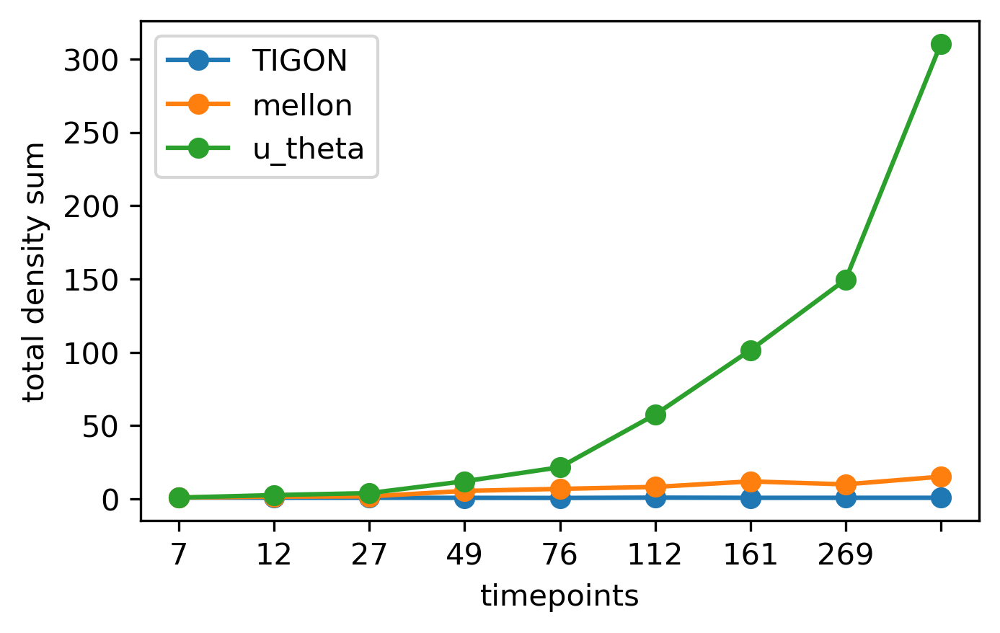

In [87]:
fig, ax = plt.subplots(1,1, figsize=(5,3), dpi=300)
ax.plot(range(9), T_sum, marker='o', label='TIGON')
ax.plot(range(9), m_sum, marker='o', label='mellon')
ax.plot(range(9), s_sum, marker='o', label='u_theta')

ax.set_xticklabels(timepoints)
ax.set_ylabel("total density sum")
ax.set_xlabel("timepoints")
ax.legend()

In [ ]:
bulk_surrogate_u = PINN.tl.get_pseudobulk(adata, 'surrogate_u', pseudobulk_key='rs50').T
bulk_surrogate_u = bulk_surrogate_u / bulk_surrogate_u.sum(axis=1).reshape(-1,1)

bulk_TIGON_u = PINN.tl.get_pseudobulk(adata, 'TIGON_u', pseudobulk_key='rs50').T
bulk_TIGON_u = bulk_TIGON_u / bulk_TIGON_u.sum(axis=1).reshape(-1,1)

bulk_mellon_u = PINN.tl.get_pseudobulk(adata, 'mellon_u', pseudobulk_key='rs50').T
bulk_mellon_u = bulk_mellon_u / bulk_mellon_u.sum(axis=1).reshape(-1,1)

In [46]:
adata.write_h5ad(f"data/{data_name}.h5ad")

In [62]:
from scipy.special import kl_div
from scipy.stats import pearsonr
from scipy.stats import spearmanr

In [88]:
kld_s = [kl_div(p_metacell[i], bulk_surrogate_u[i]).sum() for i in range(9)]
kld_m = [kl_div(p_metacell[i], bulk_mellon_u[i]).sum() for i in range(9)]
kld_t = [kl_div(p_metacell[i], bulk_TIGON_u[i]).sum() for i in range(9)]

In [91]:
kld_df = pd.DataFrame({"u_theta":kld_s, "mellon":kld_m, "TIGON":kld_t})
kld_df['timepoints'] = timepoints

In [97]:
kld_df

,u_theta,mellon,TIGON,timepoints
0,3.274027,3.428585,7.919937,3
1,2.168545,2.018801,2.689204,7
2,1.697371,1.557498,1.866347,12
3,1.194979,0.950048,1.228851,27
4,0.936105,0.843885,1.055649,49
5,1.001499,0.569532,0.951188,76
6,0.657526,0.480778,0.812730,112
7,0.743161,0.519911,0.844802,161
8,0.608768,0.481463,0.812537,269


In [92]:
import seaborn as sns

/tmp/ipykernel_33454/6170840.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(timepoints)


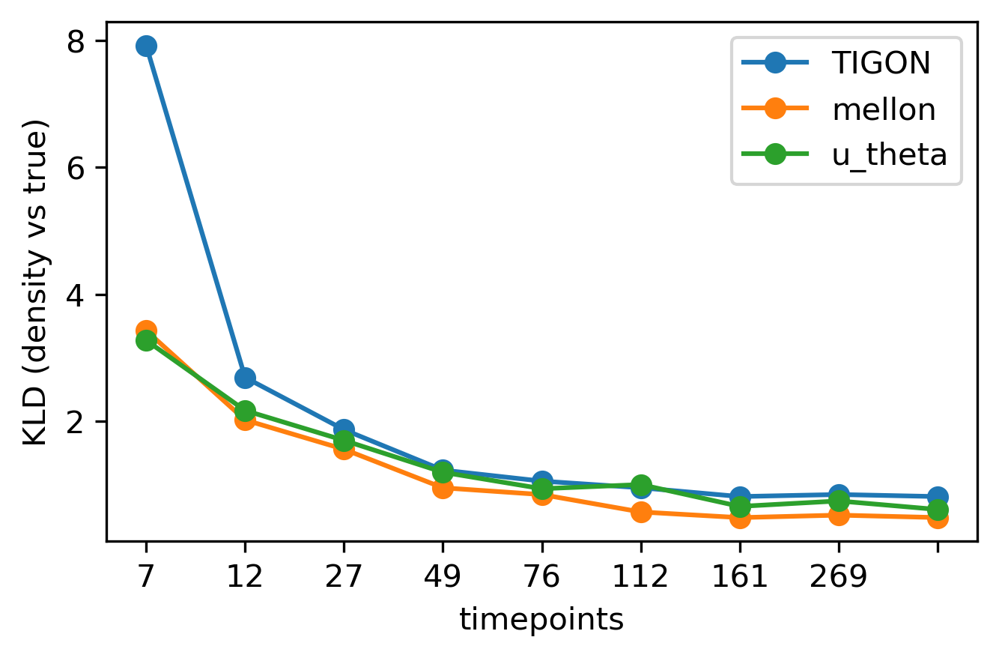

In [99]:
fig, ax = plt.subplots(1,1, figsize=(5,3), dpi=300)
ax.plot(range(9), kld_t, marker='o', label='TIGON')
ax.plot(range(9), kld_m, marker='o', label='mellon')
ax.plot(range(9), kld_s, marker='o', label='u_theta')

ax.set_xticklabels(timepoints)
ax.set_ylabel("KLD (density vs true)")
ax.set_xlabel("timepoints")
ax.legend()

In [104]:
bulk_umap = PINN.tl.get_pseudobulk(adata, 'X_umap', pseudobulk_key='rs50')

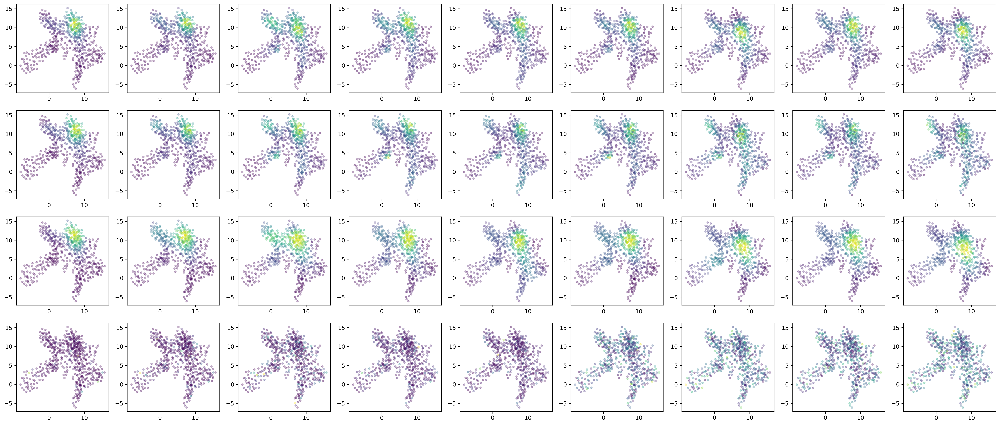

In [116]:
fig, axs = plt.subplots(4, 9, figsize=(3*9+4,13), dpi=300)
for i in range(9):
    axs[0, i].scatter( bulk_umap[:,0], bulk_umap[:,1] , c = bulk_TIGON_u[i], s=10, alpha=0.3, label='TIGON')
    axs[1, i].scatter( bulk_umap[:,0], bulk_umap[:,1] , c = bulk_mellon_u[i], s=10, alpha=0.3, label='mellon')
    axs[2, i].scatter( bulk_umap[:,0], bulk_umap[:,1] , c = bulk_surrogate_u[i], s=10, alpha=0.3, label='u_theta')
    axs[3, i].scatter( bulk_umap[:,0], bulk_umap[:,1] , c = p_metacell[i], s=10, alpha=0.3, label='true')
    

In [ ]:
p_metacell[0]

# Weinreb

In [9]:
device

'cuda:2'

In [59]:
from denmarf import DensityEstimate

de = DensityEstimate.from_file("results/denmarf_model/tom_pos_DM_scaled_scaled_161_new_bound.pkl", device='cuda:2')

In [48]:
X = adata.obsm[cellstate_key]
X_scaled = X / X.std(axis=0).reshape(1,-1)

In [18]:
X.std(axis=0).reshape(1,-1)

array([[0.17277984, 0.09758347, 0.21735312, 0.1848786 , 0.04262131,
        0.0344355 , 0.06061419, 0.16131178, 0.04470523, 0.07325026,
        0.11653553, 0.03094848, 0.03145006, 0.06579235, 0.05549051,
        0.07031152, 0.04883391, 0.04545289, 0.03196538, 0.05373794,
        0.071653  , 0.07797338, 0.029267  , 0.07657557, 0.02346174,
        0.01277286, 0.05493812, 0.04144789, 0.04561131, 0.0700513 ]],
      dtype=float32)

In [60]:
log_density = de.score_samples(X_scaled)

In [61]:
log_density

array([188.49780184, 177.18959719, 182.74961   , ..., 217.20428377,
       172.60664278, 159.53475481])

In [62]:
np.isinf(log_density).sum()

2

In [63]:
np.quantile(log_density[~np.isinf(log_density)],[0,0.01,0.1,0.5,0.9,0.99,0.999])

array([-1.66526320e+10,  7.21891727e+01,  1.30498189e+02,  1.76953210e+02,
        2.11933715e+02,  2.23880193e+02,  2.26545638e+02])

In [64]:
log_density_clip = np.clip(log_density,a_min=-10, a_max=None)

In [65]:
log_density_clip

array([188.49780184, 177.18959719, 182.74961   , ..., 217.20428377,
       172.60664278, 159.53475481])

In [66]:
adata.obs['log_density_clip'] = log_density_clip

In [67]:
%matplotlib inline

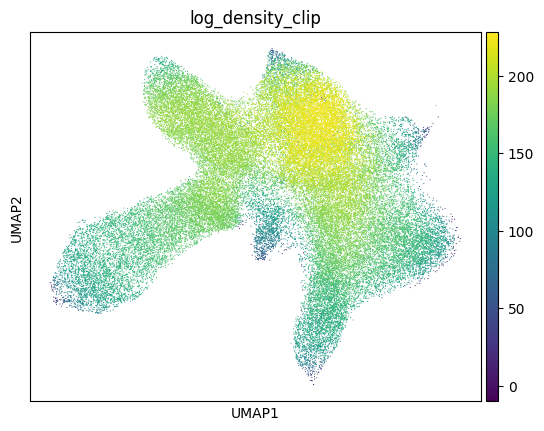

In [68]:
sc.pl.umap(adata, color='log_density_clip')

In [69]:
density = np.exp(log_density_clip)

In [71]:
density = density / density.sum()

In [74]:
np.quantile(np.log(density),[0,0.01,0.1,0.5,0.9,0.99,0.999])

array([-242.01233028, -160.14966173, -101.51560228,  -55.06189745,
        -20.07867639,   -8.13214983,   -5.46670088])

In [82]:
gde = DensityEstimate.from_file("results/denmarf_model/gastrulation_DM_EigenVectors_multiscaled_6.5_new_bound.pkl", device='cuda:2')

In [83]:
X_gas = gas.obsm['DM_EigenVectors_multiscaled']

In [84]:
log_u_gas = gde.score_samples(X_gas)

In [85]:
np.isinf(log_u_gas).sum()

0

In [86]:
# new
np.quantile(log_u_gas, [0,0.01,0.1,0.5, 0.8 ,0.9,0.99,0.999])

array([-8.39456152e+09, -3.65858918e+08, -3.02958796e+07, -1.33238199e+04,
        7.18787848e+01,  1.52806955e+02,  1.80375902e+02,  1.89563139e+02])

In [ ]:
# old
np.quantile(log_u_gas, [0,0.01,0.1,0.5, 0.8 ,0.9,0.99,0.999])

array([-2.01295937e+08, -1.11949264e+08, -9.55712179e+04, -9.11171622e+02,
        9.02808920e+01,  1.63831099e+02,  1.94318236e+02,  2.07038313e+02])


array([-2.01295937e+08, -1.11949264e+08, -9.55712179e+04, -9.11171622e+02,
        9.02808920e+01,  1.63831099e+02,  1.94318236e+02,  2.07038313e+02])

In [91]:
gas.obs['log_density'] = np.clip(log_u_gas, a_min=-180, a_max=None)

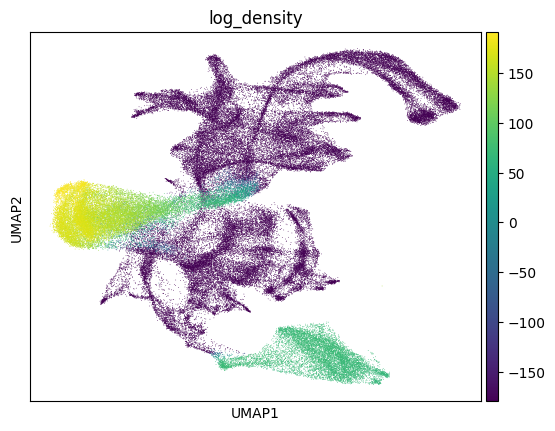

In [92]:
sc.pl.umap(gas, color='log_density')

In [93]:
# nobound

In [104]:
gde_nob = DensityEstimate.from_file("results/denmarf_model/gastrulation_DM_EigenVectors_multiscaled_8.5.pkl", device='cuda:2')

In [106]:
u_nobound = gde_nob.score_samples(X_gas)

In [107]:
u_nobound.min()

-1270.05126953125

In [108]:
np.quantile(u_nobound, [0,0.01,0.1,0.5,0.9, 0.99, 0.999])

array([-1270.05126953, -1230.29141113, -1123.00957031,   -14.43034172,
          29.7723568 ,    62.21203442,    62.72875832])

In [110]:
gas.obs['u_nobound'] = np.clip(u_nobound, a_min=-200, a_max=None)

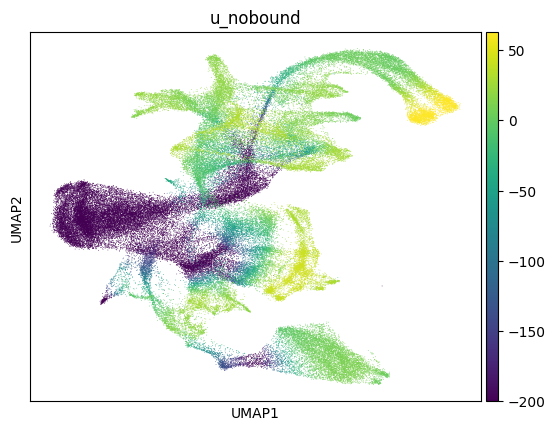

In [111]:
sc.pl.umap(gas, color='u_nobound')